In [1]:
from utils import *
from plot import *
from calcCNV import *
from calcNMF import * 

/bgfs/alee/chelsea/apps/anaconda3/envs/py37/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [14]:
!conda list 

# packages in environment at /bgfs/alee/chelsea/apps/anaconda3:
#
# Name                    Version                   Build  Channel
_ipyw_jlab_nb_ext_conf    0.1.0                    py37_0  
_libgcc_mutex             0.1                        main  
alabaster                 0.7.12                   py37_0  
anaconda                  2019.10                  py37_0  
anaconda-client           1.7.2                    py37_0  
anaconda-navigator        1.9.7                    py37_0  
anaconda-project          0.8.3                      py_0  
asn1crypto                1.0.1                    py37_0  
astroid                   2.3.1                    py37_0  
astropy                   3.2.2            py37h7b6447c_0  
atomicwrites              1.3.0                    py37_1  
attrs                     19.2.0                     py_0  
babel                     2.7.0                      py_0  
backcall                  0.1.0                    py37_0  
backports                 1

In [4]:
# Prep files
chr_pos = pd.read_csv('../data/CNV/hg38_chromPos.csv', index_col=0)
gene_pos = pd.read_csv('../data/CNV/geneinfo.csv')

# Calc
## CNV derived sub-populations

In [2]:
adata_ref_raw = sc.read('../data/scVelo/AL1_ref_raw.h5ad') 
adata_fi = sc.read('../data/scVelo/AL1.h5ad') 
adata_ref_raw.obs = adata_fi.obs 

In [6]:
chr_pos = pd.read_csv('../data/CNV/hg38_chromPos.csv', index_col=0)
gene_pos = pd.read_csv('../data/CNV/geneinfo.csv')

In [7]:
CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4',  'MCF10A', 'HEK293']

CNVDict = {}

min_genes_per_arm = 100
min_cl_cells = 20
min_cl_prob = 0.95

for cell in CellTypes:
    CNVDict[cell] = {}
    cnv = None
    n = -1
    arms = []
    armsMulti = []
    
    tmp_raw = adata_ref_raw[adata_ref_raw.obs['CellType']==cell]
    X = np.array(tmp_raw.X.todense()).T # genes X cell
    cts_raw = pd.DataFrame(X, index=tmp_raw.var.index, columns=tmp_raw.obs.index) # gene X cell
    
    genes, cells, ER_MvAvg = calcMovingAvg(cts_raw, gene_pos, win=100) # gene X cell
    cts = pd.DataFrame(ER_MvAvg, index=genes, columns=cells) # gene X cell
    CNVDict[cell]['WindowCts'] = cts.T # cell X genes
    
    CNVDict[cell]['gmm'] = {}
    for arm in chr_pos.index:

        genes = gene_pos[gene_pos['arm']==arm]['symbol'].values
        genes_s = [g for g in genes if g in cts.index]
        
        x = np.mean(cts.loc[genes_s,:], axis=0).values 
        X = np.reshape(x, (len(x),1))  
            
        if len(genes_s) < min_genes_per_arm:
            print('Low cov: {} {}'.format(cell, arm))
            
        if len(genes_s) > min_genes_per_arm:
            
            arms.append(arm)
            n += 1
            if n == 0:
                cnv = x
            elif n > 0:
                cnv = np.vstack((cnv, x))
            best_gmm = pred_model(X)
            
            if best_gmm.n_components > 1:
                predicts = best_gmm.predict(X)
                probs = best_gmm.predict_proba(X)
                
                for i in range(best_gmm.n_components):
                    cells_cl = np.where(predicts==i)[0]
                    probs_cl = probs[cells_cl,i].flatten()
                    if sum(probs_cl > min_cl_prob) < min_cl_cells:  
                        break 
                    elif sum(probs_cl > min_cl_prob) > min_cl_cells: 
                        if i < best_gmm.n_components-1:
                            continue
                        if i==(best_gmm.n_components-1):  
                            print('\n',cell, arm, len(genes_s), best_gmm.n_components, Counter(best_gmm.predict(X)))
                            armsMulti.append(arm)
                            CNVDict[cell]['gmm'][arm] = best_gmm
    
    cnv_df = pd.DataFrame(cnv, index=arms, columns=cts.columns)  # Arm X cells
    CNVDict[cell]['ArmCts'] = cnv_df.T 
           
    if len(armsMulti) < 2:
        continue

    multiModel_cnv_df = cnv_df.loc[armsMulti, :] 
    CNVDict[cell]['ArmCtsMulti'] = multiModel_cnv_df.T # cell X Arms


 MCF7 7p 531 2 Counter({0: 852, 1: 125})
Low cov: MCF7 13p
Low cov: MCF7 14p
Low cov: MCF7 15p

 MCF7 20p 321 2 Counter({1: 862, 0: 115})
Low cov: MCF7 21p
Low cov: MCF7 22p
Low cov: MCF7 Yp
Low cov: MCF7 Yq

 T47D WT 5p 343 2 Counter({0: 389, 1: 120})

 T47D WT 5q 1280 2 Counter({0: 413, 1: 96})
Low cov: T47D WT 13p
Low cov: T47D WT 14p

 T47D WT 14q 1370 2 Counter({1: 425, 0: 84})
Low cov: T47D WT 15p

 T47D WT 15q 1113 2 Counter({1: 264, 0: 245})

 T47D WT 16q 702 2 Counter({0: 425, 1: 84})
Low cov: T47D WT 21p
Low cov: T47D WT 22p
Low cov: T47D WT Yp
Low cov: T47D WT Yq
Low cov: T47D KO 13p
Low cov: T47D KO 14p
Low cov: T47D KO 15p
Low cov: T47D KO 21p
Low cov: T47D KO 22p
Low cov: T47D KO Yp
Low cov: T47D KO Yq
Low cov: MM134 13p
Low cov: MM134 14p
Low cov: MM134 15p
Low cov: MM134 21p
Low cov: MM134 22p
Low cov: MM134 Yp
Low cov: MM134 Yq

 SUM44 10p 297 2 Counter({0: 228, 1: 86})
Low cov: SUM44 13p
Low cov: SUM44 14p
Low cov: SUM44 15p

 SUM44 17p 555 2 Counter({1: 182, 0: 132}

In [9]:
fname = 'final.CNVDict'
f = open("../data/CNV/%s.pkl"%(fname),"wb")
pickle.dump(CNVDict,f)
f.close()

In [2]:
for cell, v in CNVDict.items():
    if 'ArmCtsMulti' in v.keys():
        print(cell) # the plotting gets error when doing a for loop

MCF7
T47D WT
SUM44
MCF10A
HEK293


In [10]:
CellDict = pickle.load(open("../data/scVelo/CellAdataDict.pkl",'rb'))

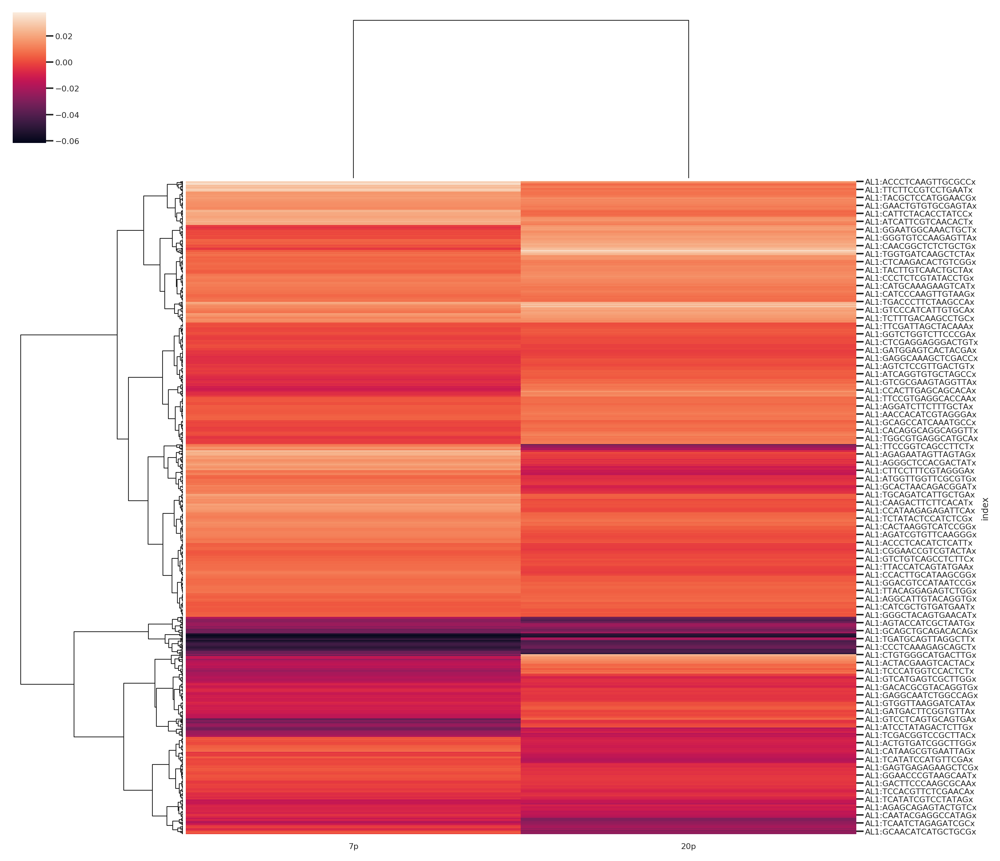

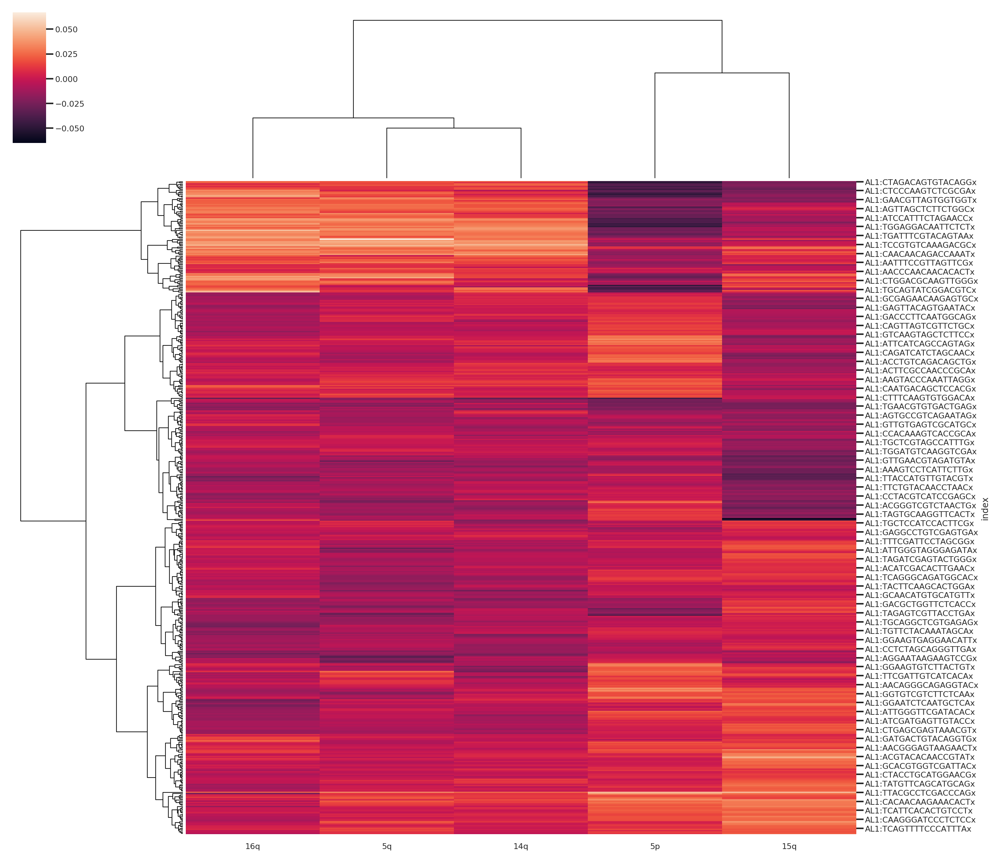

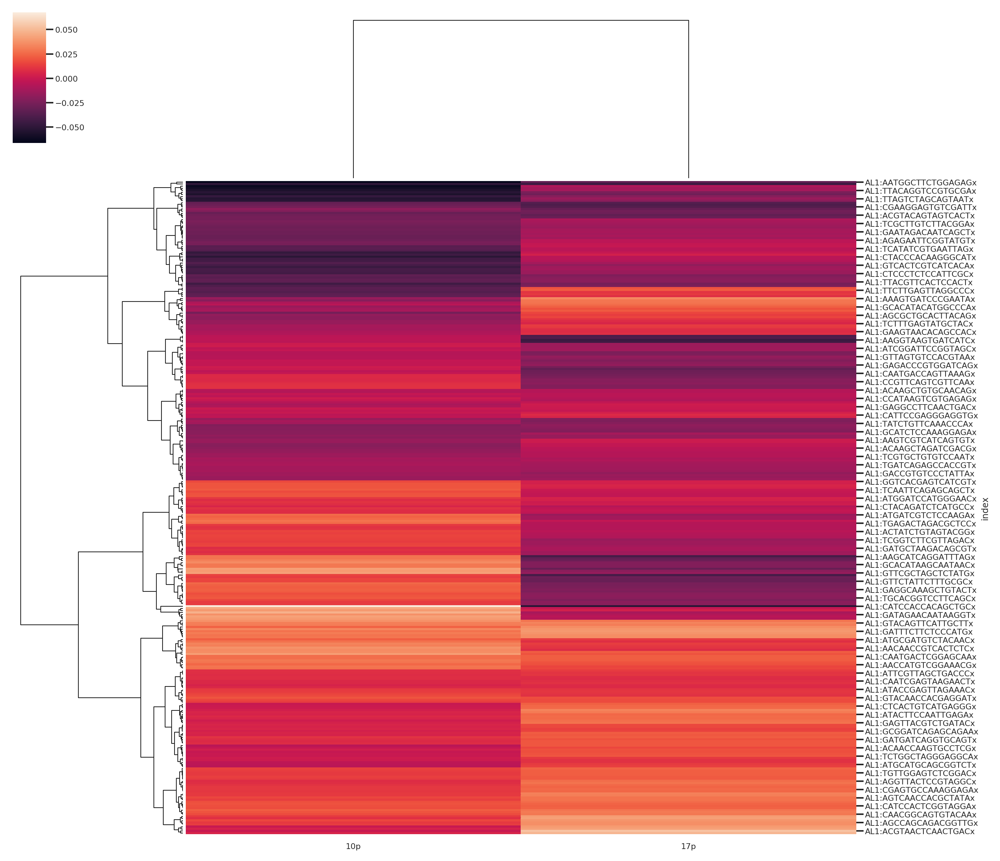

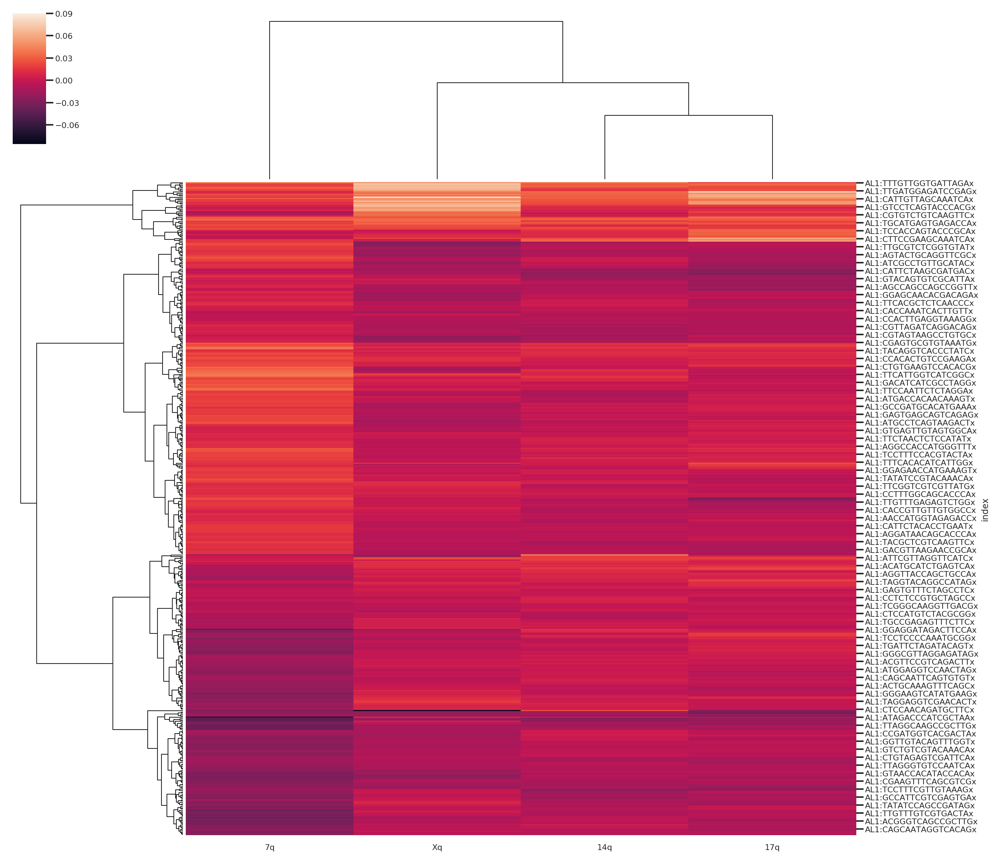

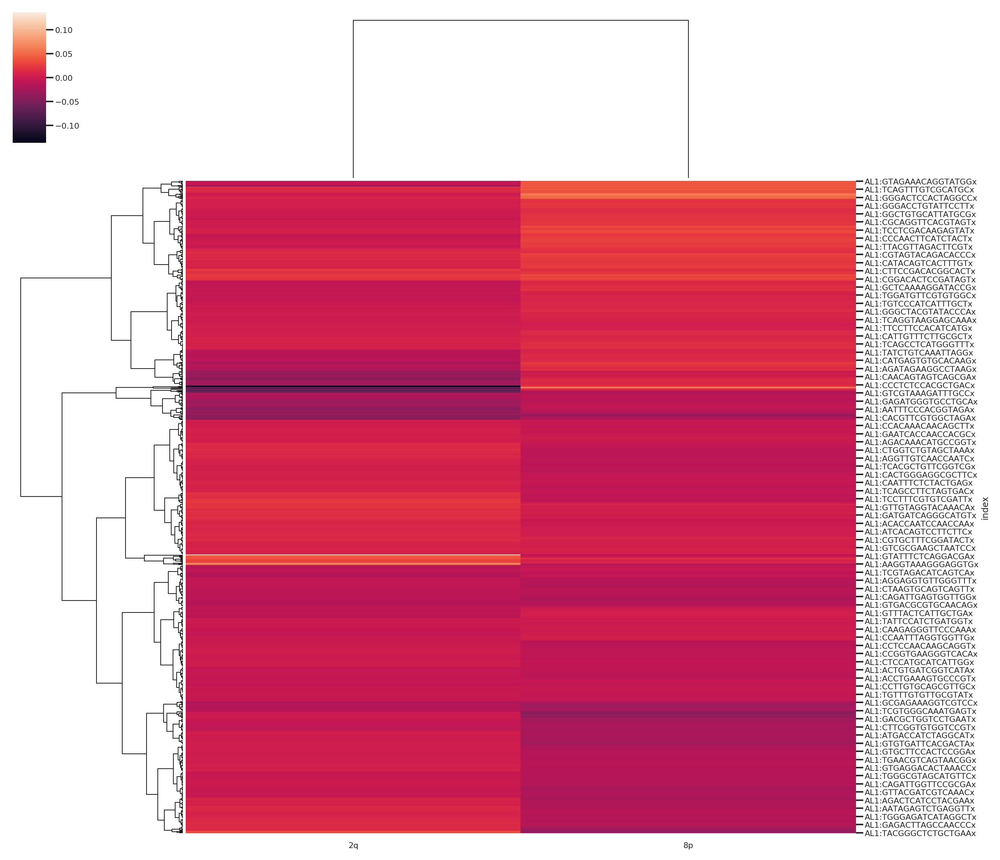

In [11]:
from utils import *

CellDict = pickle.load(open("../data/scVelo/CellAdataDict.pkl",'rb'))
CNVDict = pickle.load(open('../data/CNV/final.CNVDict.pkl','rb'))

# heatmap (cell X Arm) settings
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
        font_scale=0.6, color_codes=True)
cbar_ratio = 0.07
height = 1.2

for cell, v in CNVDict.items():

    tmp = CellDict[cell]
    sc.tl.louvain(tmp, resolution=1) # changing resolution
    sc.tl.draw_graph(tmp)
    
    if 'ArmCtsMulti' in v.keys():
        
        multiModel_cnv_df = CNVDict[cell]['ArmCtsMulti']
        g0 = sns.clustermap(multiModel_cnv_df, method='ward', metric='euclidean')
        CNVTree = get_clade_labels(multiModel_cnv_df.index.tolist(), g0.dendrogram_row.linkage, depth=2) 
        CNVTree = { i+1:val for i,val in enumerate(CNVTree.values()) }
        
        CNV_label = []
        for cell in tmp.obs.index:
            for name, cells in CNVTree.items():
                if cell in cells:
                    CNV_label.append(name)

        tmp.obs['CNV_cluster'] = CNV_label # direct change info
        tmp.obs['CNV_cluster'] = tmp.obs['CNV_cluster'].astype('category')
        

In [12]:
fname = 'Cell_CNV_AdataDict'
f = open("../data/CNV/%s.pkl"%(fname),"wb")
pickle.dump(CellDict,f)
f.close()

# Plot

## Subpopulations

In [1]:
from utils import *

CellDict = pickle.load(open("../data/CNV/Cell_CNV_AdataDict.pkl",'rb'))
CNVDict = pickle.load(open('../data/CNV/final.CNVDict.pkl','rb'))

/bgfs/alee/chelsea/apps/anaconda3/envs/py37/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
for cell, v in CNVDict.items():
    if 'ArmCtsMulti' in v.keys():
        print(cell) # the plotting gets error when doing a for loop

MCF7
T47D WT
SUM44
MCF10A
HEK293


saving figure to file ./figures/scvelo_SubPop_MCF7.png


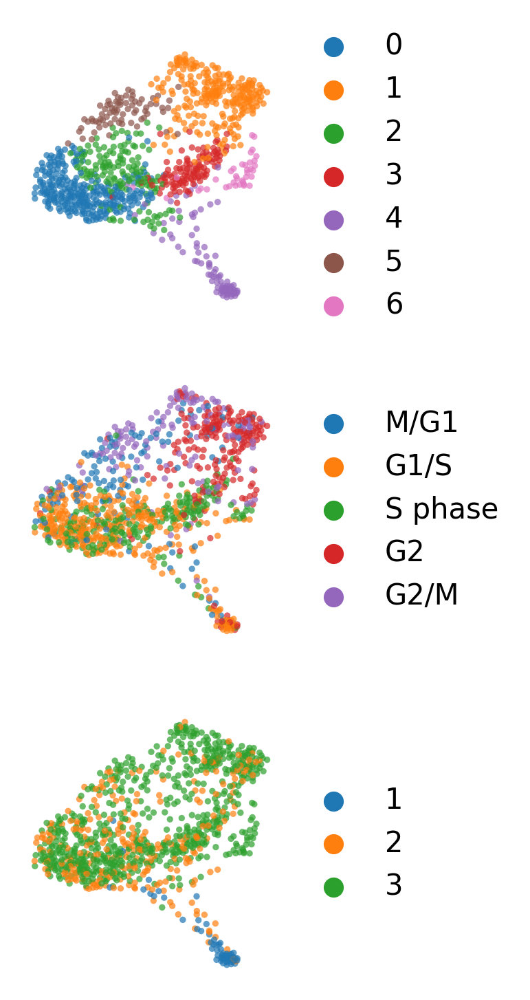

saving figure to file ./figures/scvelo_SubPop_T47D WT.png


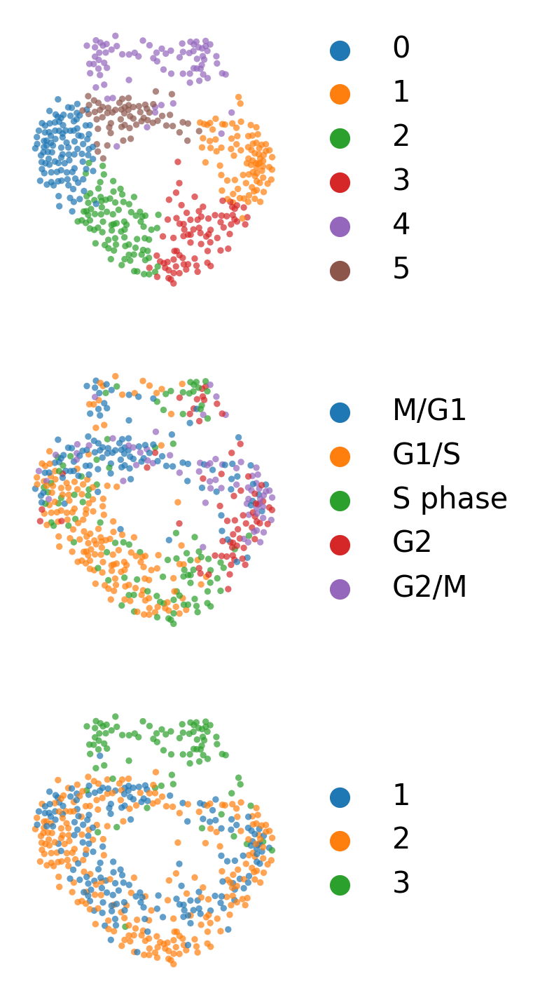

saving figure to file ./figures/scvelo_SubPop_SUM44.png


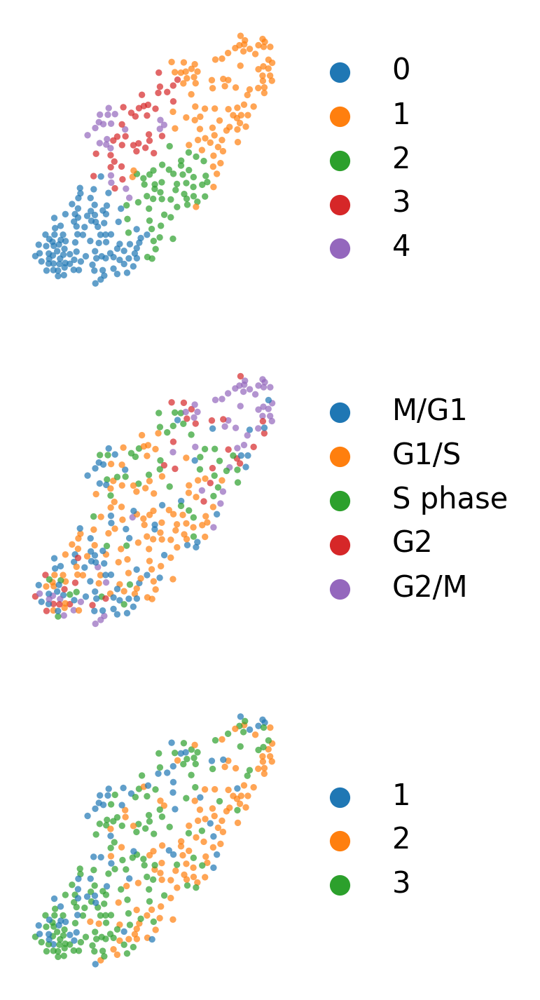

saving figure to file ./figures/scvelo_SubPop_MCF10A.png


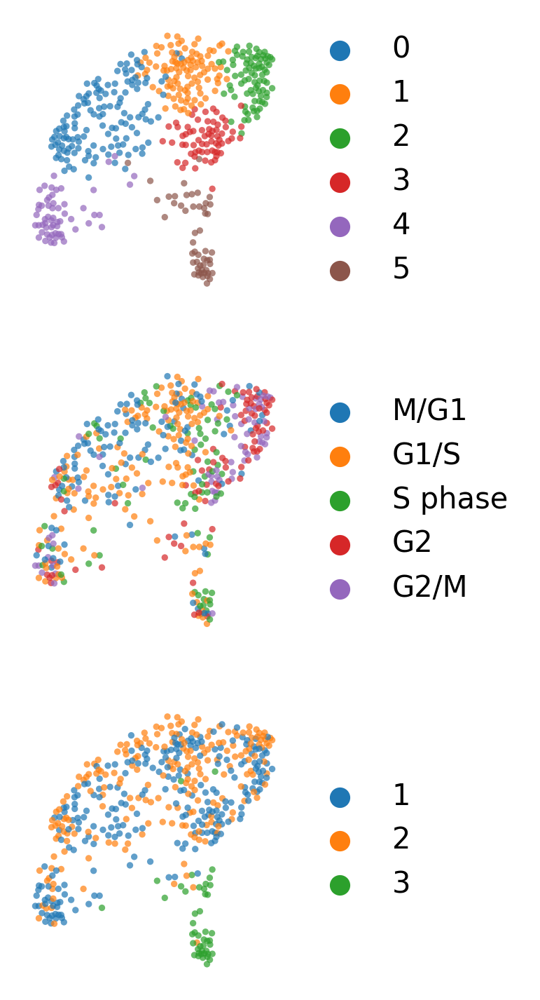

saving figure to file ./figures/scvelo_SubPop_HEK293.png


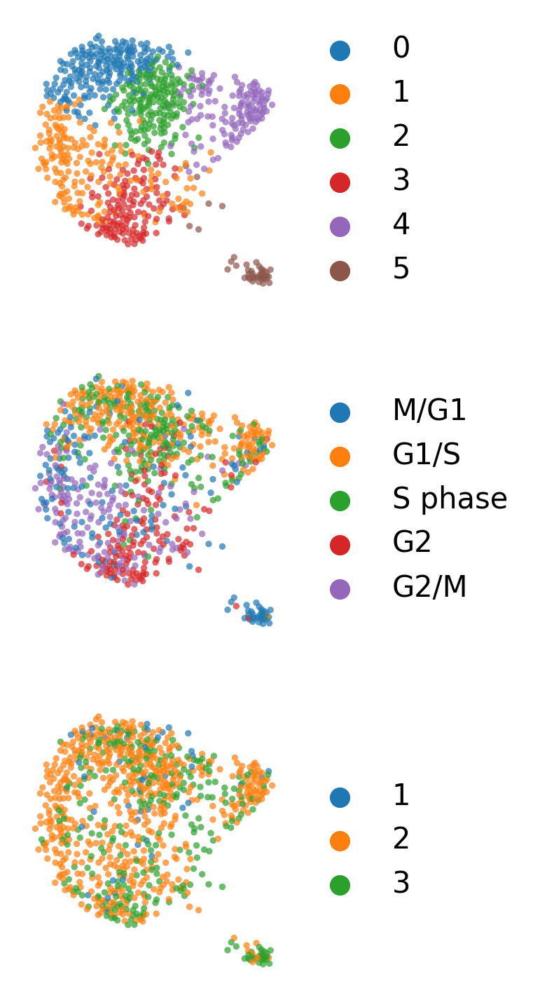

In [3]:
for cell in ['MCF7','T47D WT','SUM44','MCF10A','HEK293']:

    tmp = CellDict[cell].copy()
    # scatter map
    scv.pl.scatter(tmp, color=['louvain', 'phase','CNV_cluster'], title='',
                       legend_loc='right margin',  ncols=1,basis='draw_graph_fa',alpha=.7,
                       figsize=(1.6,2), size=20, dpi=300, save=f'SubPop_{cell}.png')

In [12]:
!mv ./figures/* ../Figure/Fig2/  

In [4]:
plt.style.use('NaturePub')
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
        font_scale=1.2, color_codes=True)

In [9]:
multiModel_cnv_df 

,2q,8p
index,,
AL1:AAACGAAAGAGGATCCx,0.004394,-0.018401
AL1:AAAGTCCAGACATCCTx,0.012881,0.006738
AL1:AAAGGGCAGCTGCCTGx,0.001007,-0.009730
AL1:AAAGGATTCTACTATCx,0.007353,0.006863
AL1:AAAGGTATCCATTGTTx,-0.034734,-0.013493
...,...,...
AL1:TTTATGCAGTAGTCCTx,0.015903,-0.008804
AL1:TTTACGTCATAAGCAAx,0.009573,-0.012200
AL1:TTTGACTCAGTTTGGTx,0.014276,-0.004259


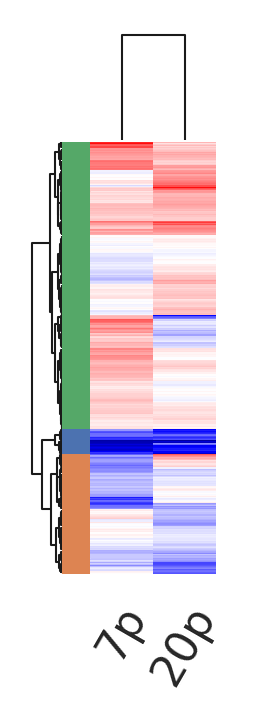

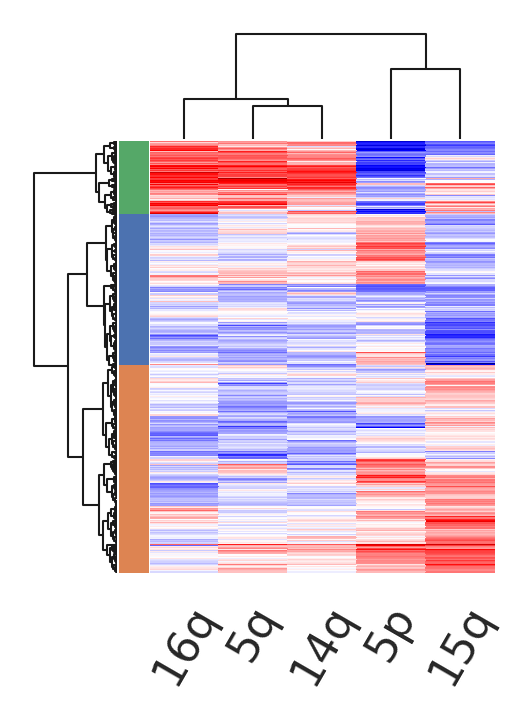

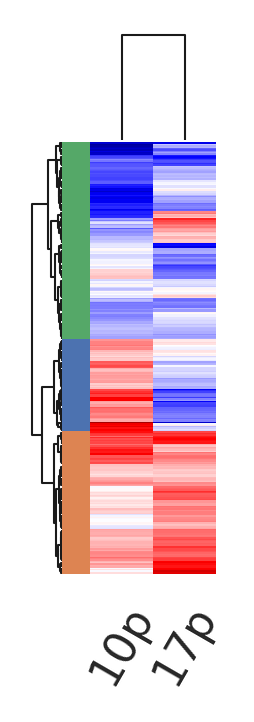

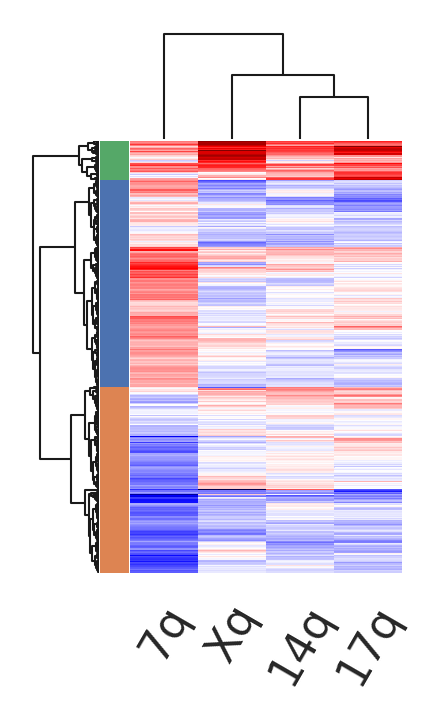

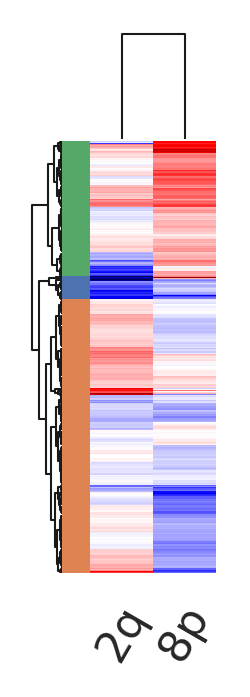

In [11]:
for cell in ['MCF7','T47D WT','SUM44','MCF10A','HEK293']:

    multiModel_cnv_df = CNVDict[cell]['ArmCtsMulti']
    tmp = CellDict[cell].copy()
    # heatmap
    cbar_ratio = 0.07
    height = 2.4
    ncols = multiModel_cnv_df.shape[1]
    width = ncols * .4

    Types = np.array(tmp.obs['CNV_cluster'].dtype.categories)
    Types_colors = sns.color_palette('deep')
    row_colors = [Types_colors[np.where(Types==c)[0][0]] for c in tmp.obs['CNV_cluster'].values]

    g2 = sns.clustermap(multiModel_cnv_df.loc[tmp.obs.index,:], method='ward', metric='euclidean',
                        row_colors=[row_colors], col_cluster=0.2,
                        cmap='seismic', vmin=-0.08, vmax=0.08, width_colors_ratio=5*cbar_ratio/ncols,
                        figsize=(width, height))   

    g2.ax_heatmap.set_yticks([])
    g2.ax_heatmap.set_yticklabels('')
    g2.ax_heatmap.set_ylabel('')

    xticklabels = multiModel_cnv_df.columns[np.array(g2.dendrogram_col.reordered_ind)]
    g2.ax_heatmap.set_xticks([x+0.5 for x in range(len(xticklabels))])
    g2.ax_heatmap.set_xticklabels(xticklabels, rotation=60)

    g2.cax.set_visible(False)
    g2.savefig('../Figure/Fig2/MultiArm.%s.png'%cell, dpi=300, bbox_inches='tight')

In [13]:
counter = 0
for cell in CNVDict.keys():
    if 'gmm' in CNVDict[cell]:
        counter += len(CNVDict[cell]['gmm'])

print('%d arms with multi-component GMM'%counter)

15 arms with multi-component GMM


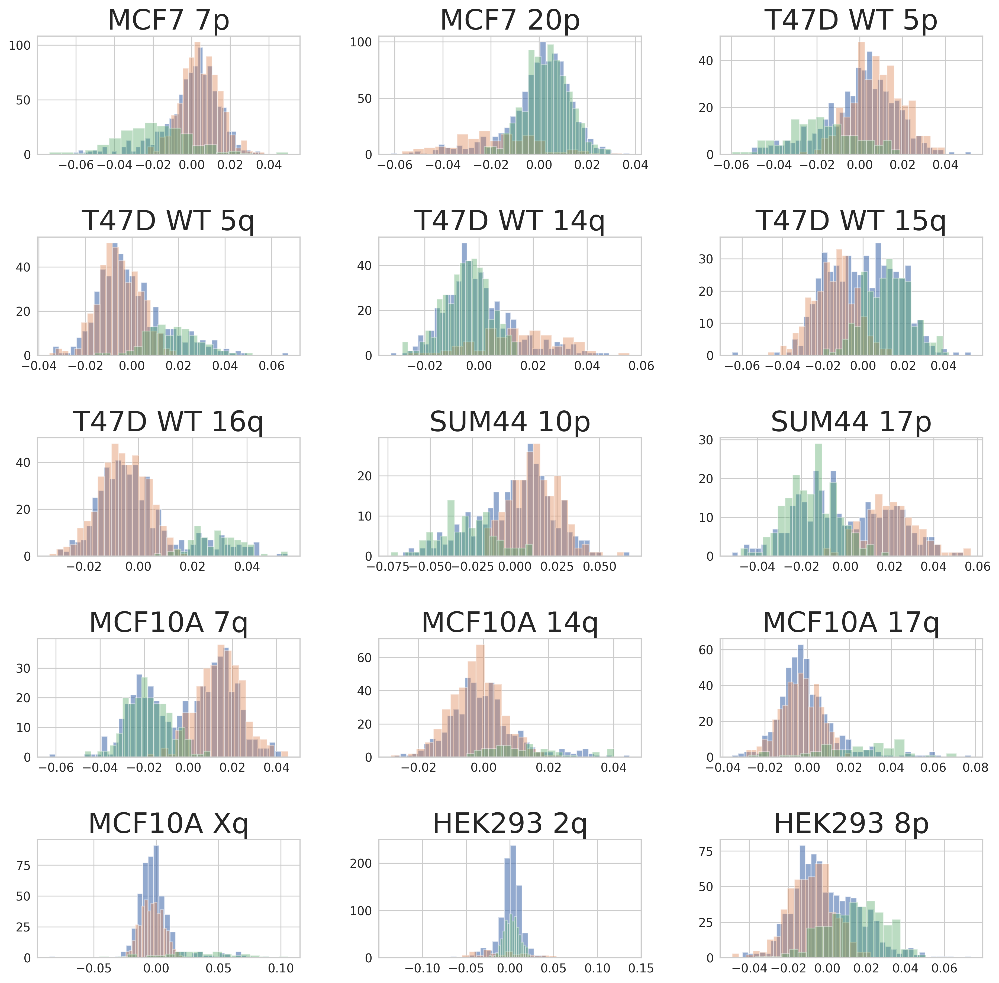

In [24]:
nplots = counter
ncols = 3
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*5, nrows*3), dpi=300)
plt.subplots_adjust(wspace=0.3, hspace=0.7) # 
axes_list = axes.flatten()

k = -1
for cell in CNVDict.keys():
    
    if 'gmm' in CNVDict[cell]:
        for chrom in CNVDict[cell]['gmm']:
            k += 1
            ax = axes_list[k]
            
            x = CNVDict[cell]['ArmCts'][chrom]
            y = CNVDict[cell]['gmm'][chrom]

            ax.hist(x, bins=40, alpha=0.6, label='Raw data') # raw-blue

            fit, label = y.sample(len(x.values))

            ax.hist(fit.flatten()[label==0], alpha=0.4, bins=20) # mode1-orange
            ax.hist(fit.flatten()[label==1], alpha=0.4, bins=20) # mode2-green
            ax.set_title('%s %s'%(cell, chrom), fontsize=25)

for i, ax in enumerate(axes_list):
    if i > nplots-1:
        ax.axis('off')
        
plt.savefig('../Figure/Fig2/HistGMM.pdf', bbox_inches='tight')

## Chrom Arm Average CNA

In [37]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)
plt.style.use(['NaturePub']) 

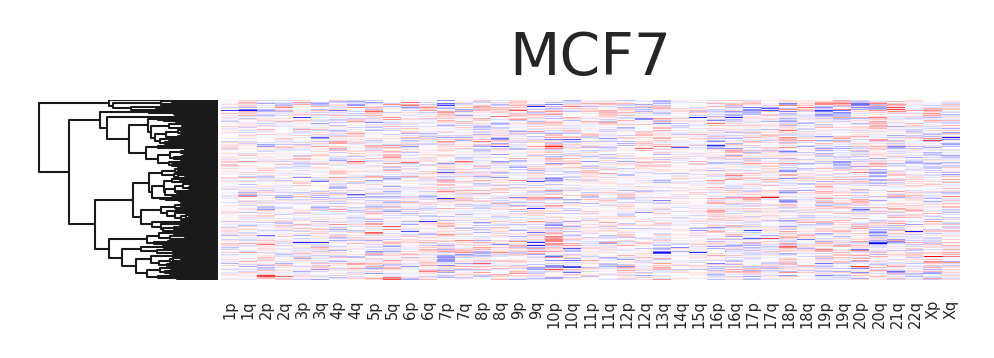

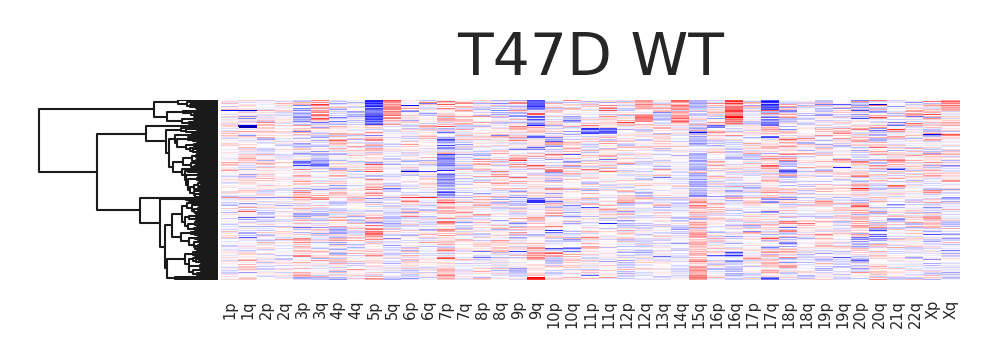

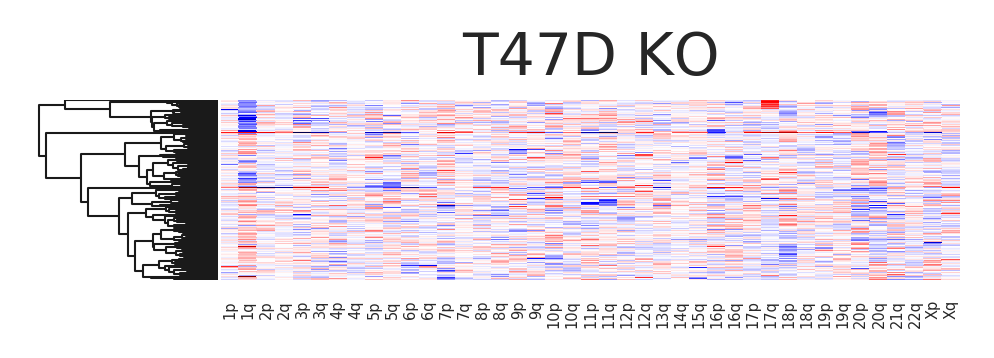

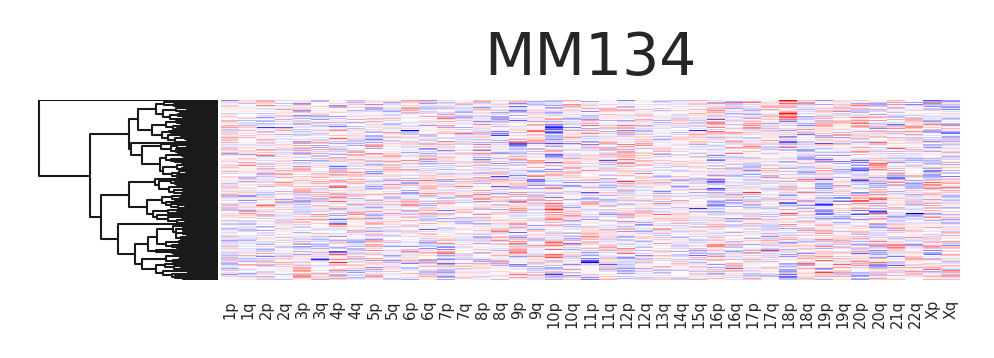

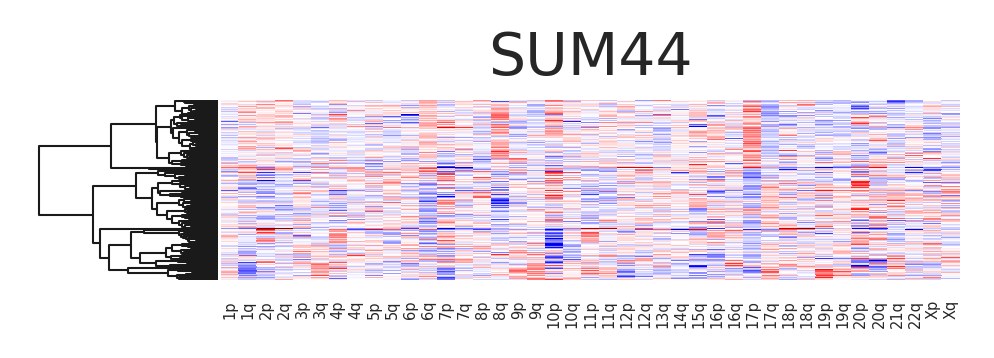

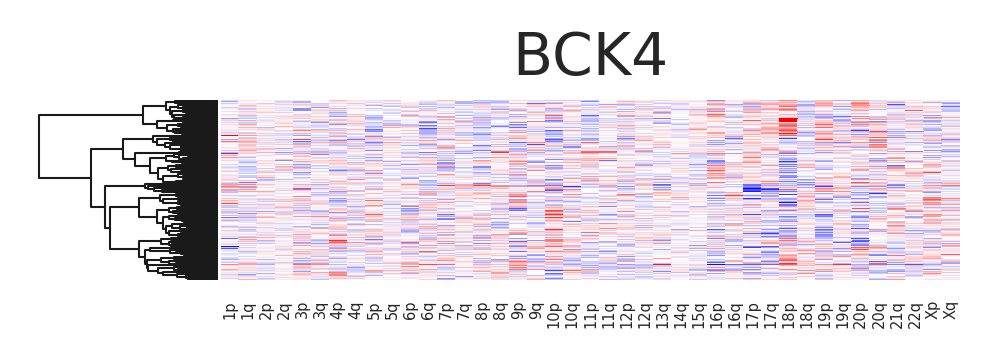

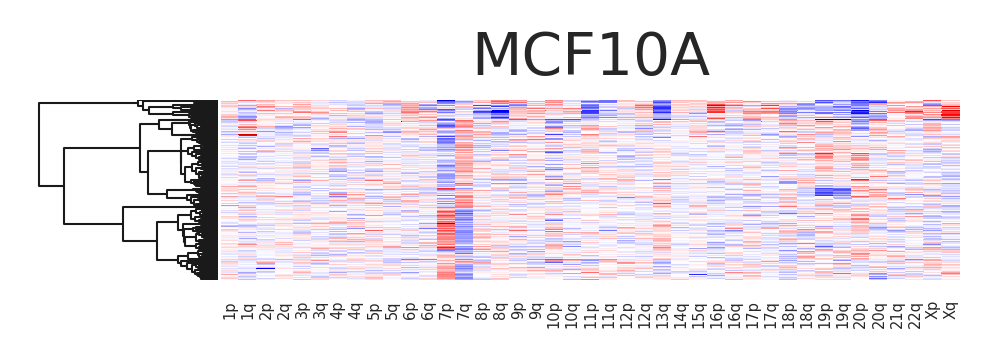

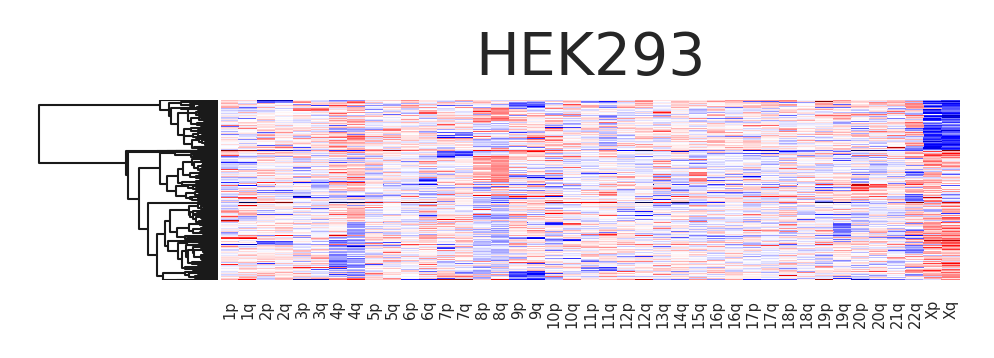

In [17]:
mpl.rcParams['xtick.major.pad']=0.001
CNVDict = pickle.load(open('../data/CNV/final.CNVDict.pkl','rb'))

CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4',  'MCF10A', 'HEK293']
for cell in CellTypes:
    
    tmp = CNVDict[cell]['ArmCts']

    g1 = sns.clustermap(tmp-np.mean(tmp, axis=1).values.reshape(tmp.shape[0],1), method='ward', metric='euclidean', col_cluster=False, 
                   cmap='seismic', figsize=(4,1), vmin=-0.1, vmax=0.1)
    g1.ax_heatmap.set_yticks([])
    g1.ax_heatmap.set_yticklabels('')
    g1.ax_heatmap.set_ylabel('')

    xlabels = tmp.columns
    g1.ax_heatmap.set_xticks([x+0.5 for x in range(len(xlabels))])
    g1.ax_heatmap.set_xticklabels(xlabels, rotation=90, fontsize=3.5)
    g1.ax_heatmap.tick_params(axis='x', which='major', pad=0)

    cbar = g1.cax
    x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
    cbar.set_visible(False)
    
    g1.ax_heatmap.set_title(cell, fontsize=14)

    g1.savefig(f'../Figure/Fig2/AllArms.{cell}.xlabel.png', dpi=300, bbox_inches='tight')
    

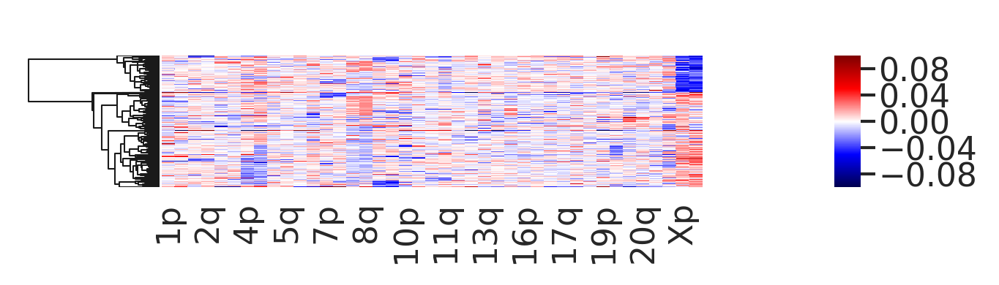

In [21]:
g1=sns.clustermap(tmp-np.mean(tmp, axis=1).values.reshape(tmp.shape[0],1), method='ward', metric='euclidean', col_cluster=False, 
                   cmap='seismic', figsize=(4,1), vmin=-0.1, vmax=0.1)
g1.ax_heatmap.set_yticks([])
g1.ax_heatmap.set_yticklabels('')
g1.ax_heatmap.set_ylabel('')
cbar = g1.cax
x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.15, y0, 0.03, y1-y0])

In [23]:
!rm ../Figure/Fig2/AllArms*pdf 

## QC metrics of CNV clusters

In [25]:
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
        font_scale=1.2, color_codes=True)

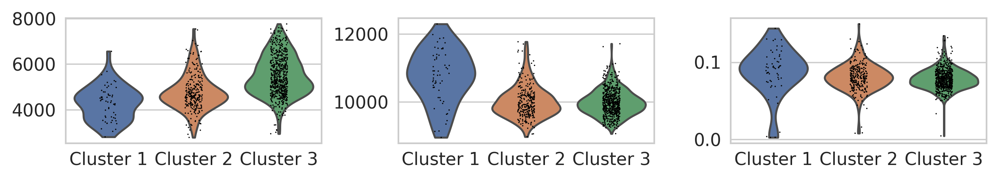

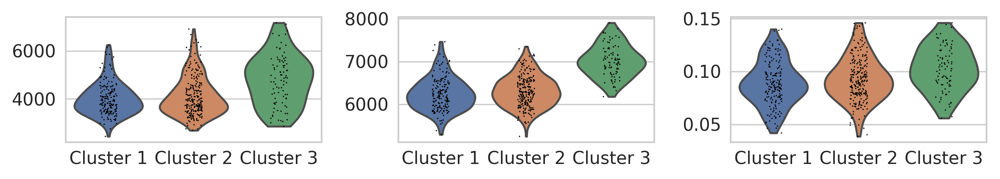

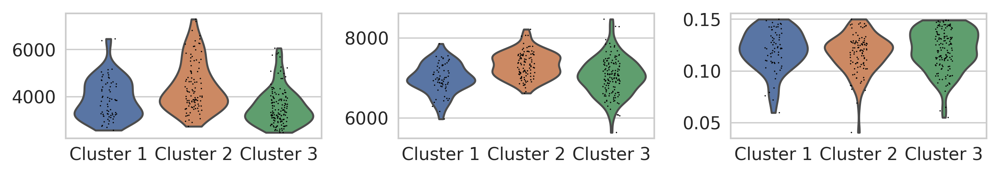

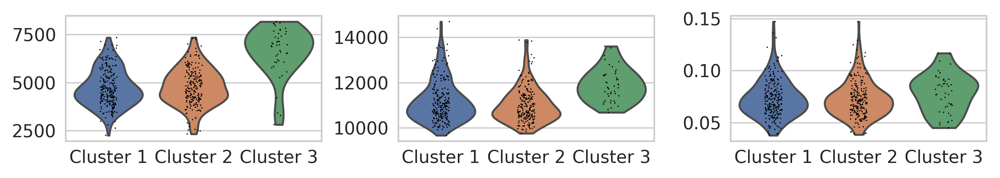

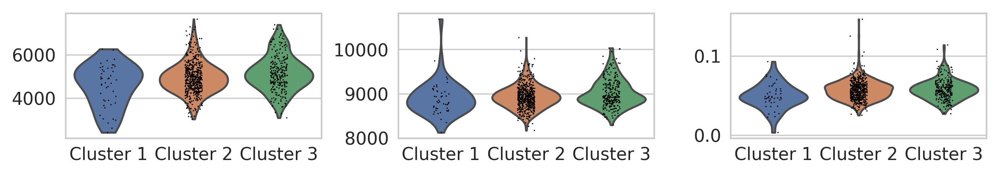

In [28]:
for cell, v in CNVDict.items():    
    if 'ArmCtsMulti' in v.keys():
        tmp = CellDict[cell].copy()
        
        # plt.style.use(['NaturePub',])
        nplots = 3
        ncols = 3
        nrows = ceil(nplots/ncols)

        fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(10,1.4))

        plt.subplots_adjust(wspace=0.3, hspace=0.1) 
        axes_list = axes.flatten()

        ax = axes_list[0]
        sc.pl.violin(tmp, ['n_genes'], groupby='CNV_cluster',rotation=0, jitter=True, size=0.8, show=False,ax=ax)
        ax.set_ylabel('')
        ax.set_xticklabels(['Cluster 1','Cluster 2','Cluster 3'])

        ax = axes_list[1]
        sc.pl.violin(tmp, ['n_counts'], groupby='CNV_cluster',rotation=0, jitter=True, size=0.8, show=False,ax=ax)
        ax.set_ylabel('')
        ax.set_xticklabels(['Cluster 1','Cluster 2','Cluster 3'])

        ax = axes_list[2]
        sc.pl.violin(tmp, ['percent_mito'], groupby='CNV_cluster',rotation=0, jitter=True, size=0.8, show=False,ax=ax)
        ax.set_ylabel('')
        ax.set_xticklabels(['Cluster 1','Cluster 2','Cluster 3'])

        plt.savefig('../Figure/Fig2/CnvViolin%s.png'%cell, dpi=300)

## Marker Genes of CNA subpopulations

In [3]:
CellDict = pickle.load(open("../data/CNV/Cell_CNV_AdataDict.pkl",'rb'))

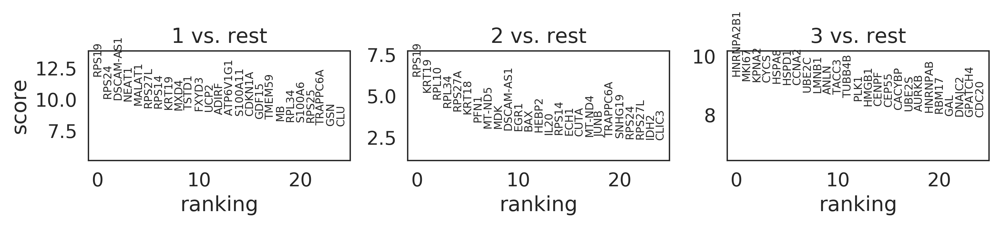

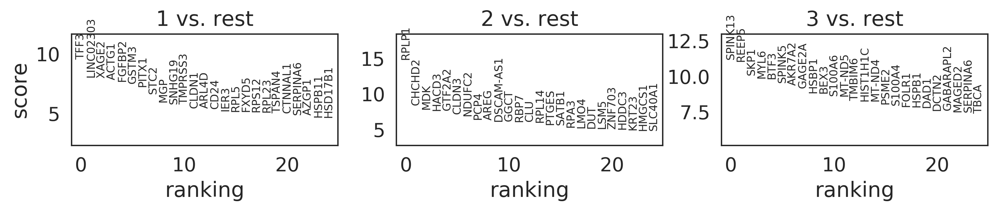

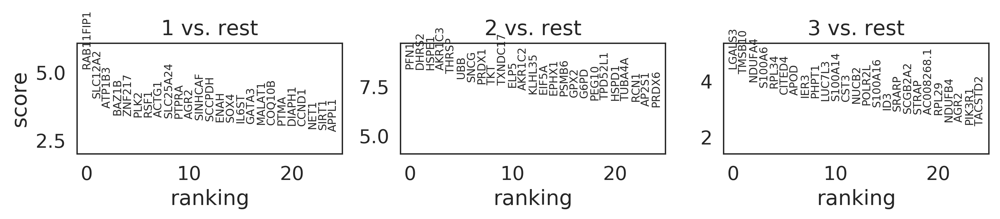

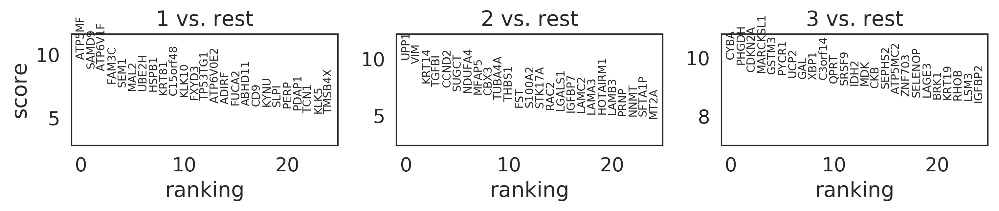

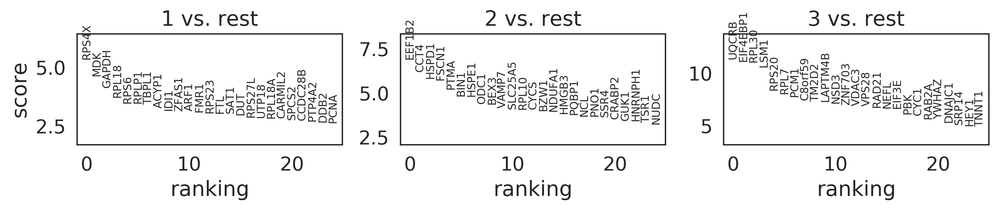

In [12]:
sns.set(context='paper', style='white', palette='deep', font='sans-serif', 
        font_scale=1.6, color_codes=True)
mpl.rc('figure', figsize=(4, 1.5), dpi=300)

for k,cell in enumerate(['MCF7', 'T47D WT', 'SUM44','MCF10A', 'HEK293']):
    tmp = CellDict[cell].copy()
    sc.tl.rank_genes_groups(tmp, 'CNV_cluster', method='wilcoxon')
    sc.pl.rank_genes_groups(tmp, n_genes=25, sharey=False, figsize=(4,2), save=f'CNV_DEG_{cell}')

In [13]:
!mv ./figures/* ../Figure/Fig2/ 

## Enrichment of CNV DEGs

... storing 'CNV_cluster' as categorical


Index(['1', '2', '3'], dtype='object')
MCF7 MIRNA Group1 top100 Marker Genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


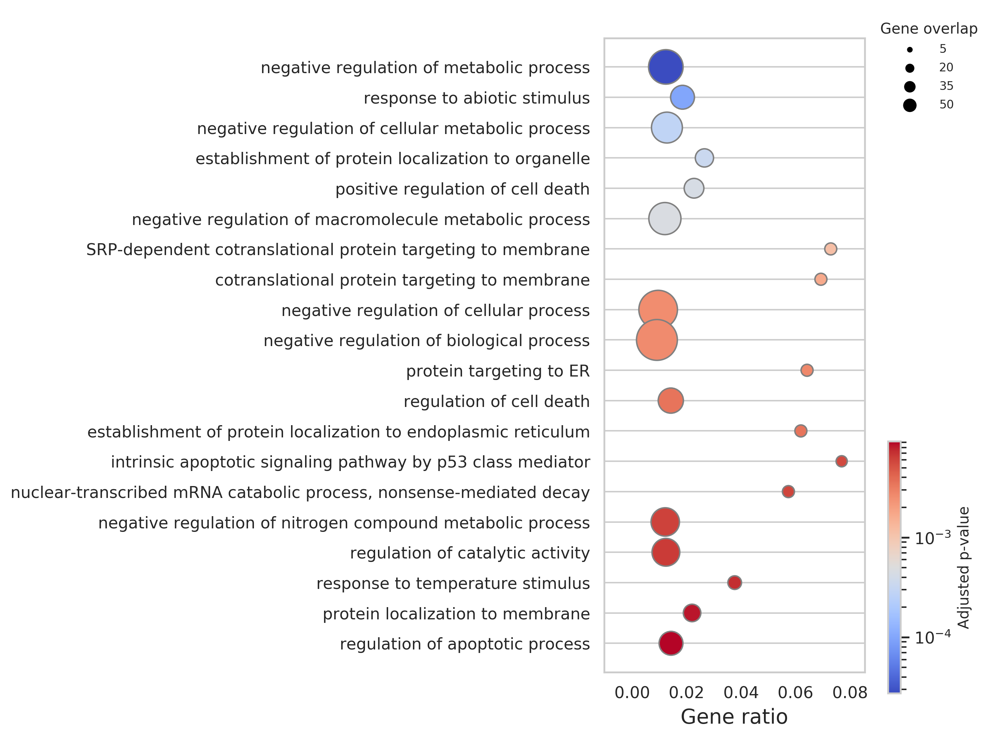

MCF7 MIRNA Group2 top100 Marker Genes
14 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=5.6000000000000005) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


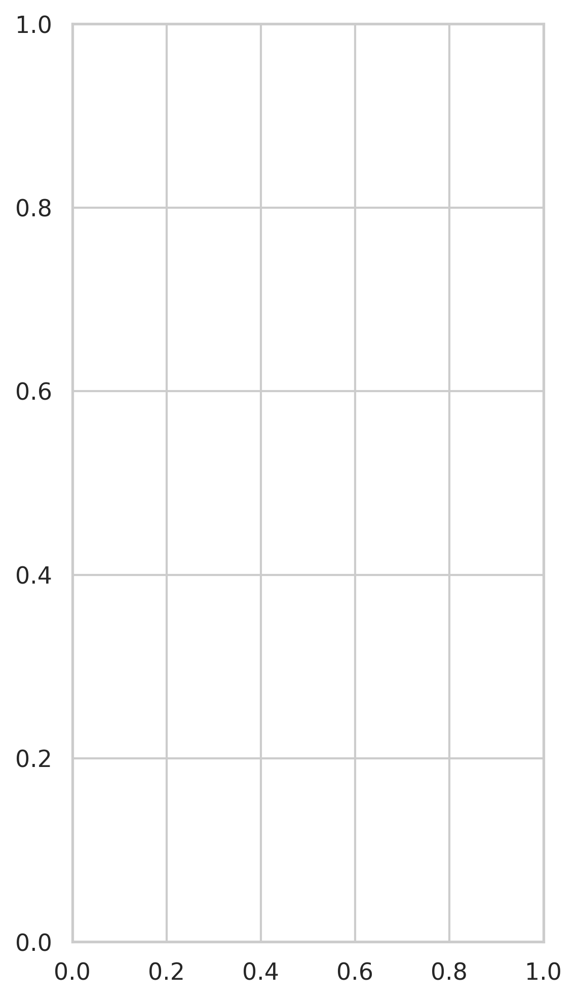

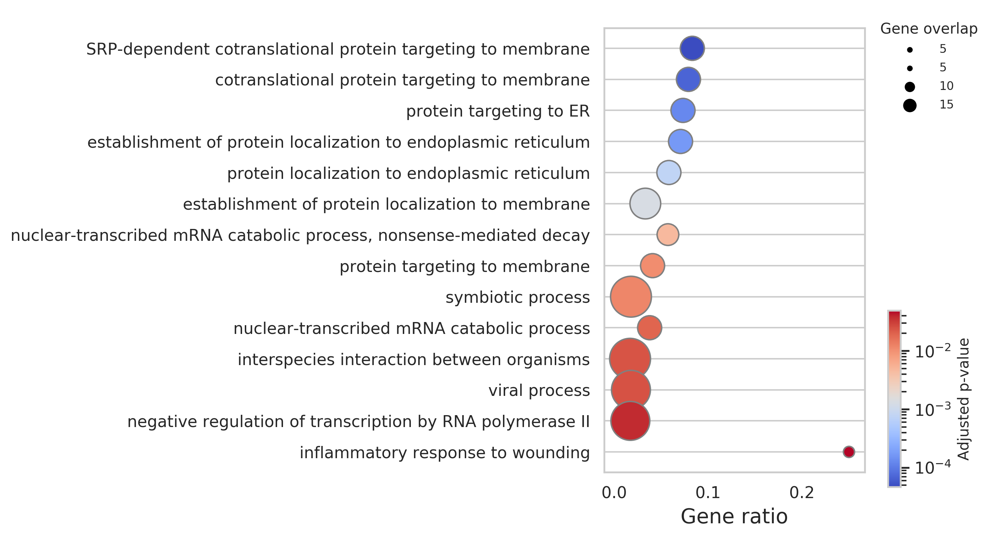

MCF7 MIRNA Group3 top100 Marker Genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


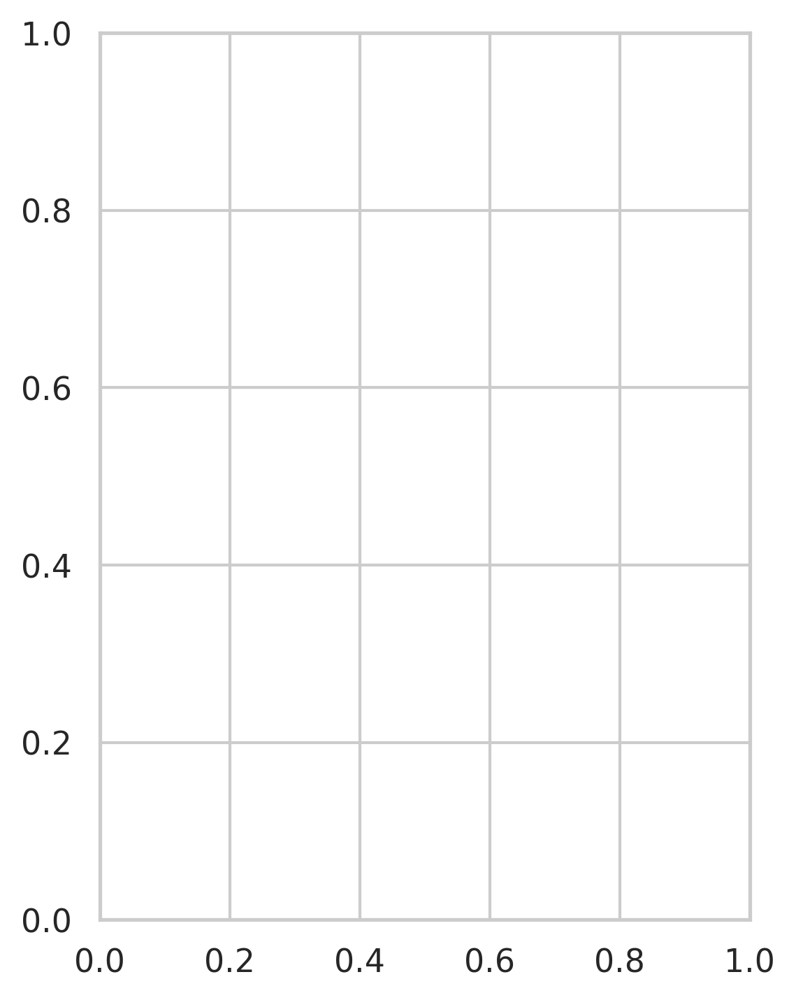

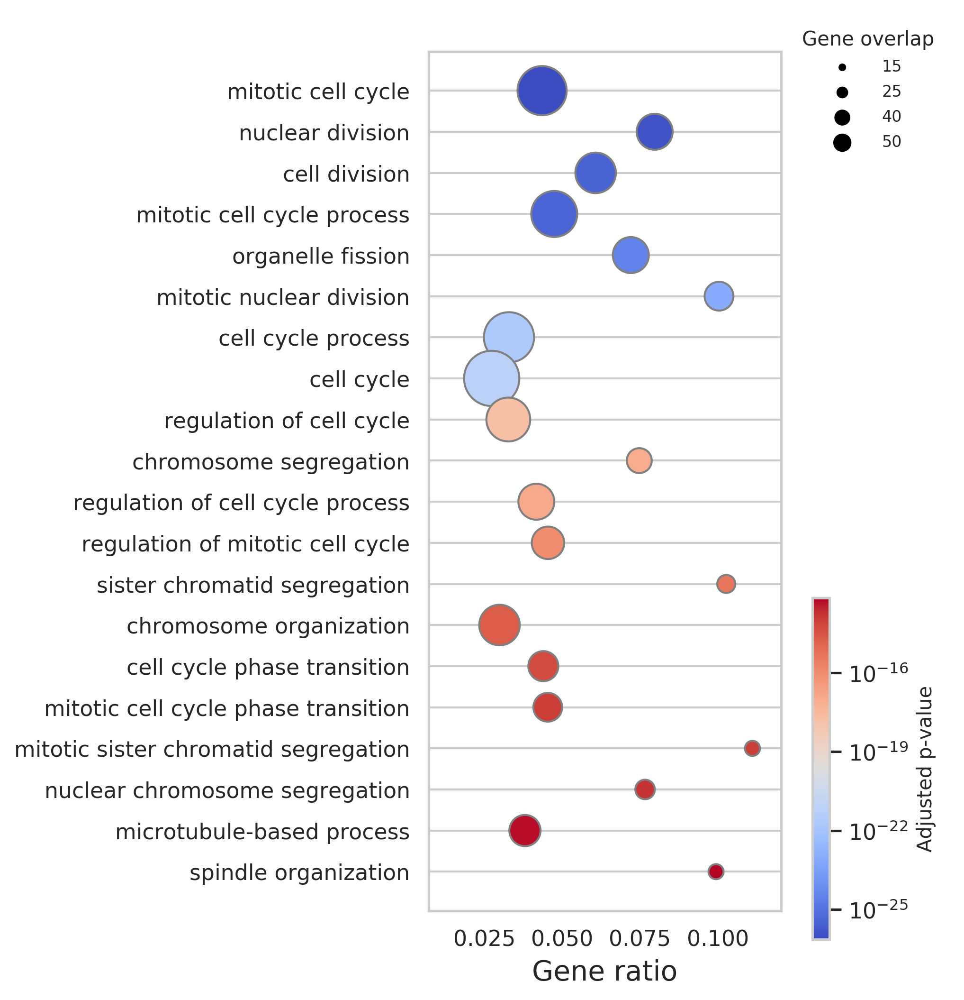

... storing 'CNV_cluster' as categorical


Index(['1', '2', '3'], dtype='object')
T47D WT MIRNA Group2 top100 Marker Genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


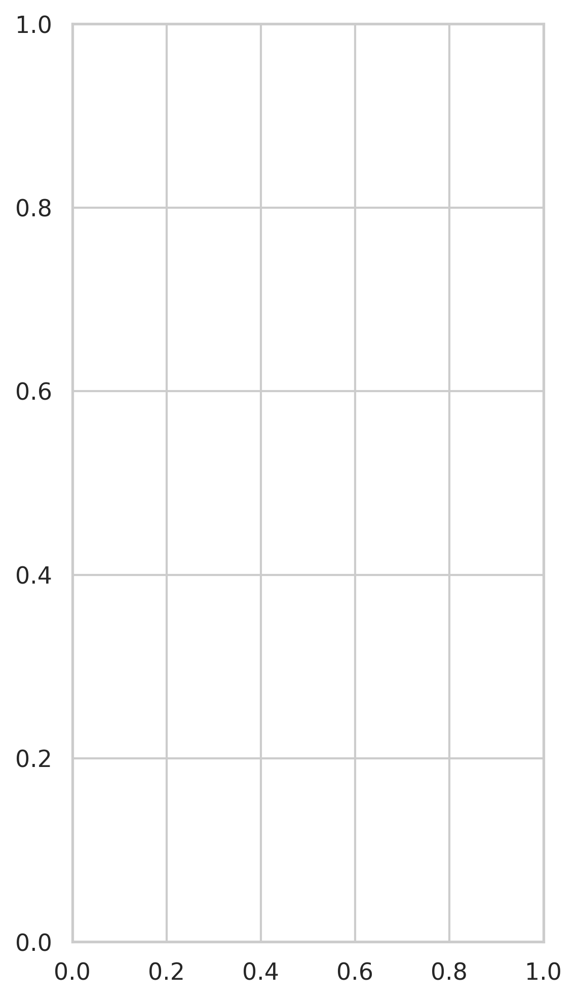

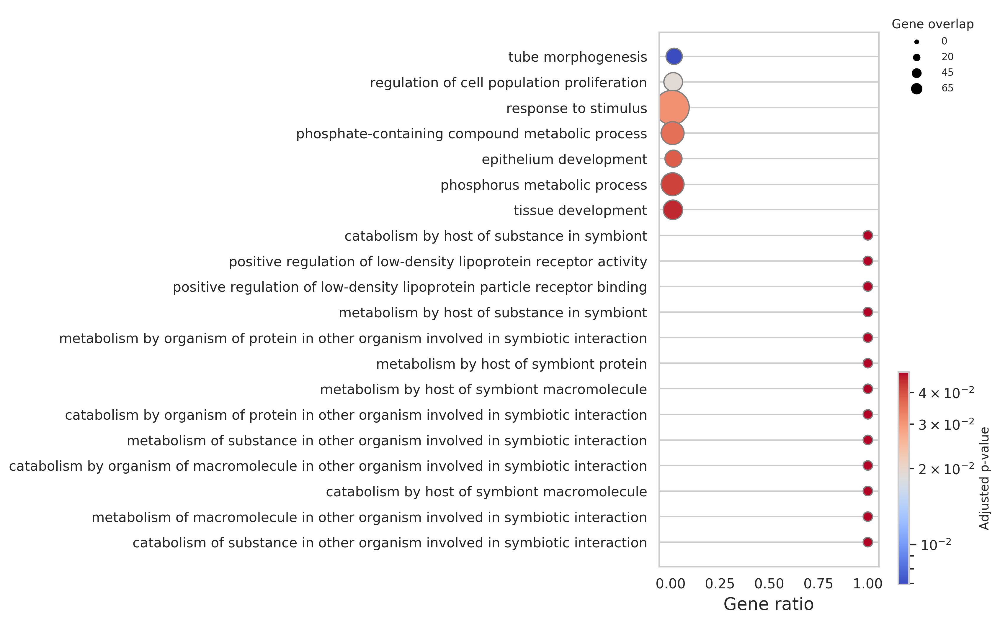

T47D WT MIRNA Group3 top100 Marker Genes
10 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=4.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


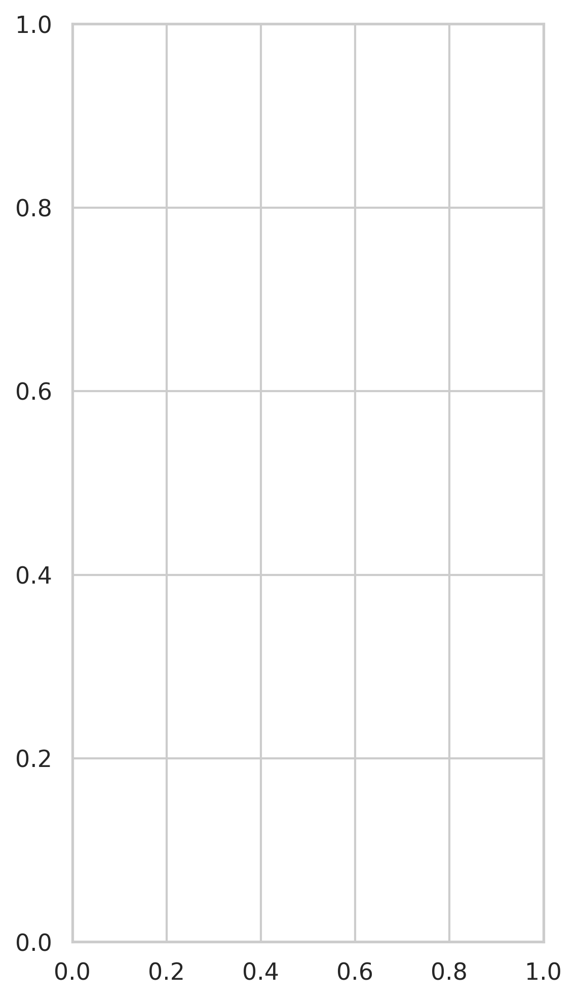

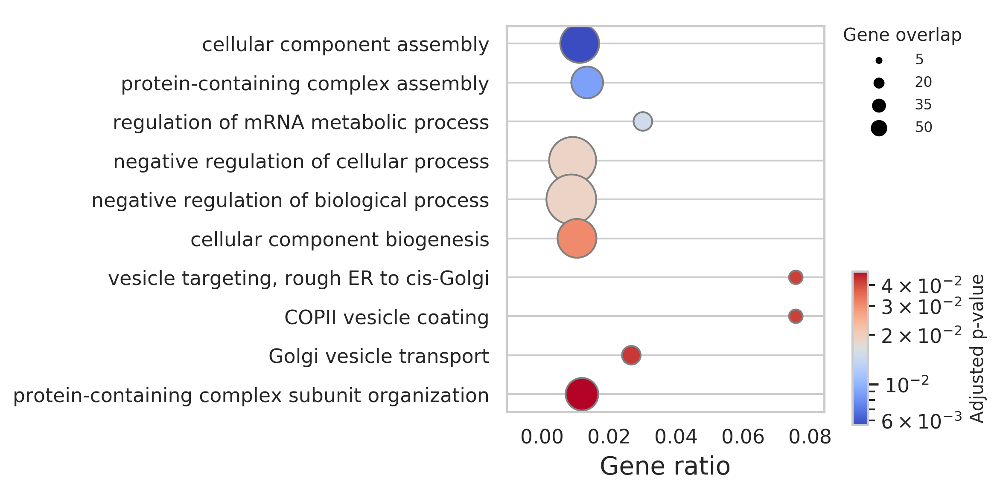

... storing 'CNV_cluster' as categorical


Index(['1', '2', '3'], dtype='object')
MCF10A MIRNA Group1 top100 Marker Genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


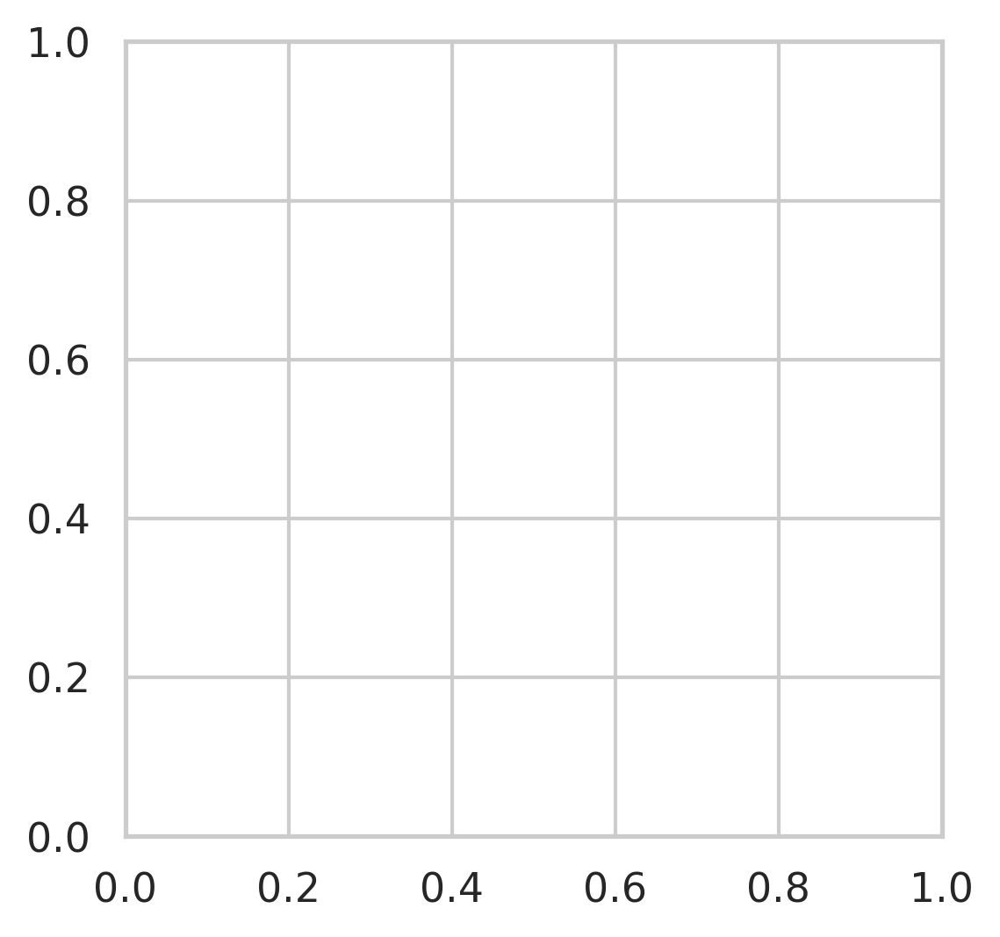

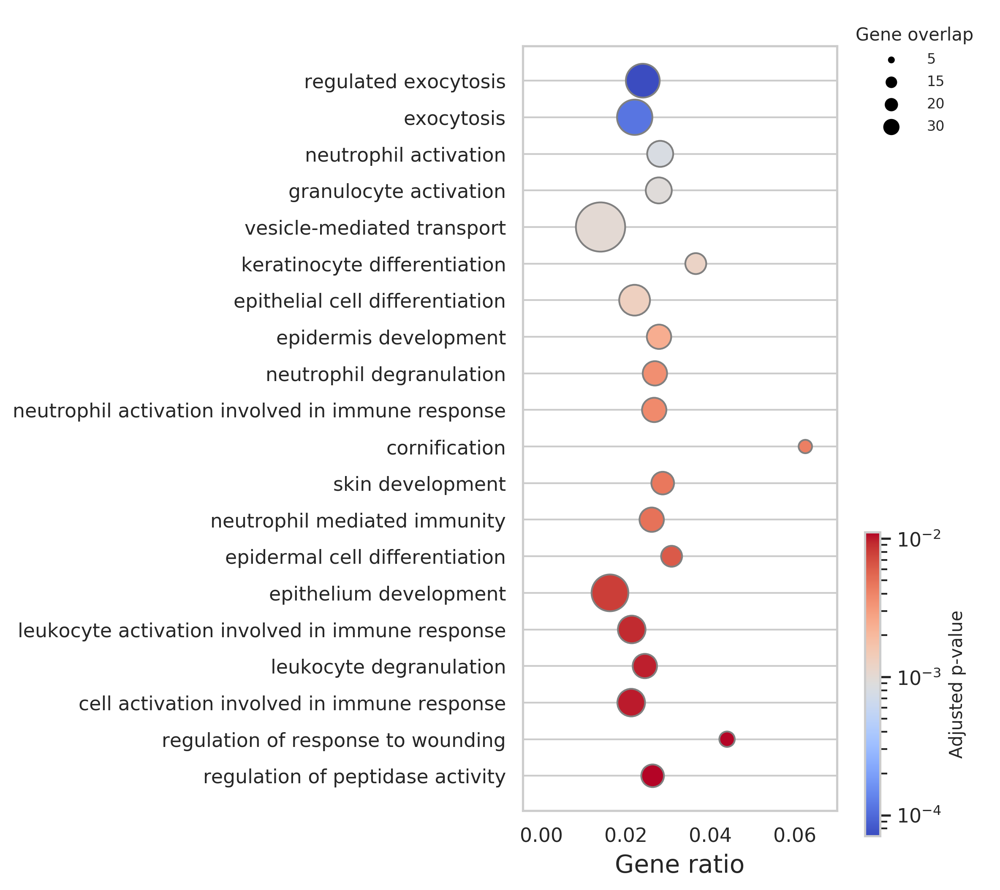

MCF10A MIRNA Group2 top100 Marker Genes
11 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=4.4) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


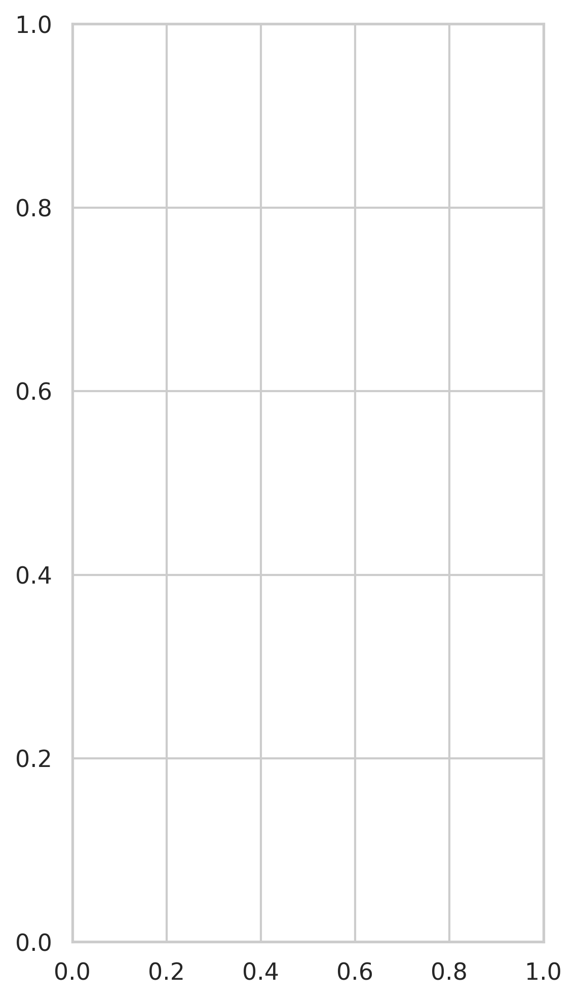

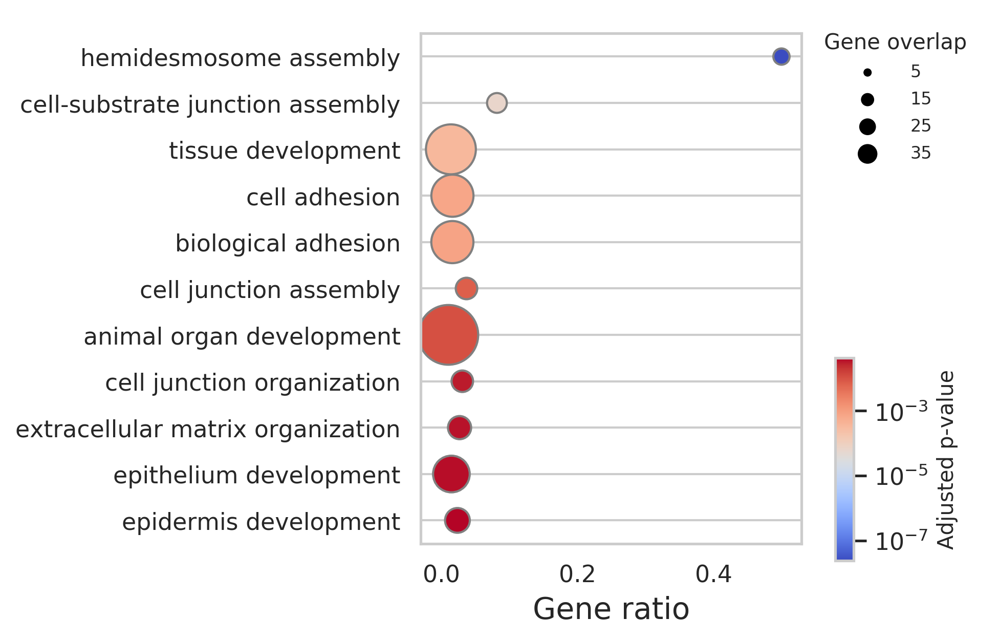

MCF10A MIRNA Group3 top100 Marker Genes
9 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=3.6) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)


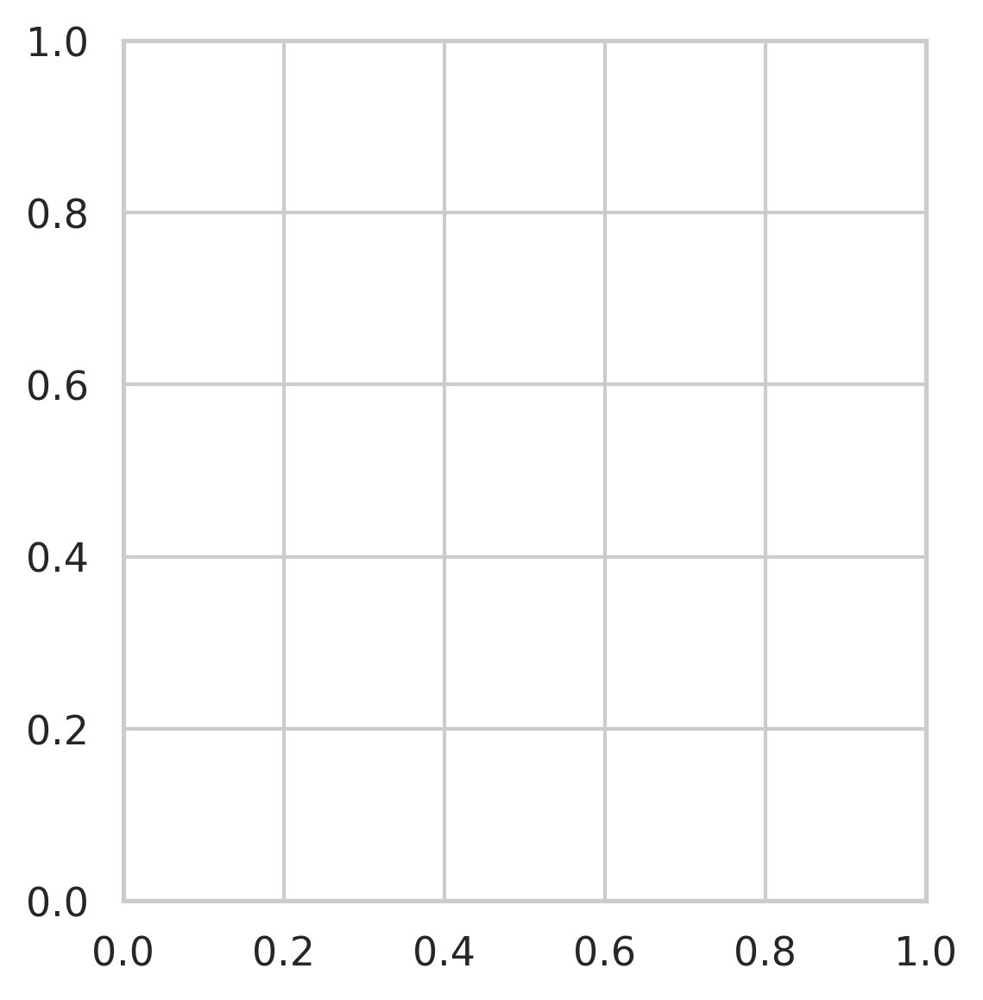

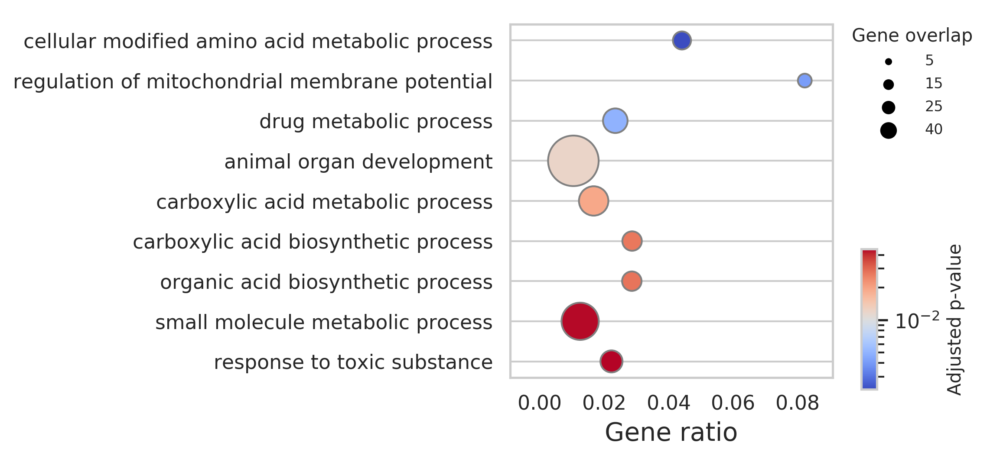

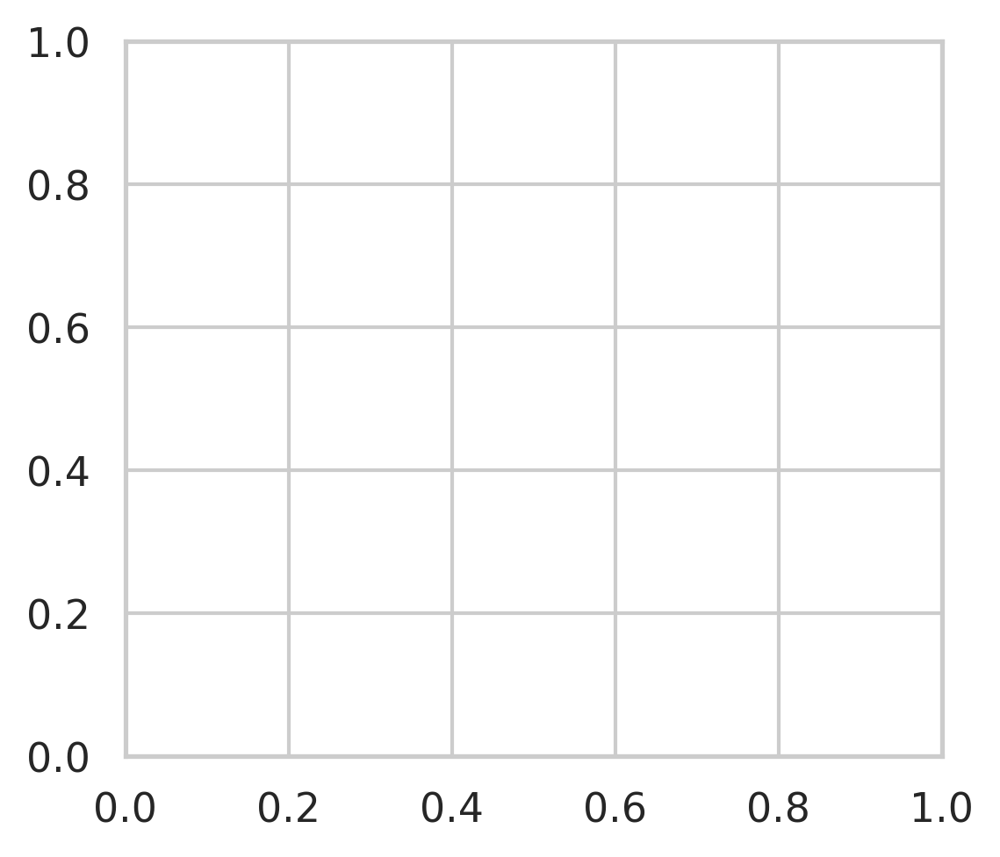

In [21]:
from plot import * 
from gprofiler import GProfiler
gp = GProfiler(
    user_agent='ExampleTool', #optional user agent
    return_dataframe=True, #return pandas dataframe or plain python structures    
)


for cell in ['MCF7', 'T47D WT','MCF10A']:    
    tmp = CellDict[cell].copy()
    tmp.obs['CNV_cluster'] = tmp.obs['CNV_cluster'].values.astype('str') # for gather_DEGs to work
     
    sc.tl.rank_genes_groups(tmp, 'CNV_cluster', method='wilcoxon')
    DEgDict = gather_degs(tmp)

    for cluster in DEgDict.keys():
        genes = list(DEgDict[cluster].index)
        gp = GProfiler(return_dataframe=True)
        enr = gp.profile(organism='hsapiens',query=genes)

        sel_enr = enr[enr['source']=='GO:BP']
        if sel_enr.shape[0] > 3:
            print('{} {} Group{} top100 Marker Genes'.format(cell, db, cluster))
            plot_enrich(sel_enr, title='')